In [1]:
# Import libraries and dependencies

%matplotlib inline
import yfinance as yf
import quantstats as qs
import numpy as np
import pandas as pd
import hvplot.pandas

import warnings
warnings.filterwarnings('ignore')

# extend pandas functionality with metrics, etc.
qs.extend_pandas()

# Data collection

In [2]:
# Names of intersted stocks
stock_names = {'ABBV',
               'PFE',
               'BAC',
               'COKE',
               'SQ',
               'AAPL',
               'AMD',
               'FDX',
               'EBAY',
               'AMZN',
               'C',
               'F',
               'GDX',
               'USO'}

In [3]:
# Get a list of metrics
sharpe_ratio = []
expected_return = []
sortino_ratio = []
var = []
covariance = []
implied_volatility = []

for ticker in stock_names: 
    
    stk = qs.utils.download_returns(ticker)  
    
    # Get Sharpe Ratio
    sharpe = stk.sharpe()  
    sharpe_ratio.append(sharpe)
    
    # Expected return
    expt_rtrn = stk.expected_return()
    expected_return.append(expt_rtrn)
    
    #Sortino
    sortino = stk.sortino()
    sortino_ratio.append(sortino)

    #variance
    variance = stk.var()
    var.append(variance)
    
    #covariance
    cvar = stk.cvar()
    covariance.append(cvar)
       

# DataFrame for Metrics finalised

In [4]:
metrics_df = pd.DataFrame({"SharpeRatio": sharpe_ratio,
                           "ExpectedReturn": expected_return,
                           "SortinoRatio": sortino_ratio,
                          "Var": var,
                          "Covariance": covariance},
                          index = stock_names)

metrics_df.sort_index(ascending=True)

,SharpeRatio,ExpectedReturn,SortinoRatio,Var,Covariance
AAPL,0.626003,0.000711,0.913353,0.000812,-0.067945
ABBV,0.800934,0.000730,1.134137,0.000308,-0.043925
AMD,0.441214,0.000338,0.653894,0.001411,-0.092348
AMZN,0.812820,0.001217,1.296238,0.001338,-0.089078
BAC,0.364421,0.000264,0.539647,0.000585,-0.063831
C,0.325025,0.000198,0.479584,0.000655,-0.070006
COKE,0.437616,0.000364,0.654312,0.000474,-0.053092
EBAY,0.635662,0.000788,1.020676,0.001059,-0.082895
F,0.396294,0.000309,0.593032,0.000497,-0.054086
FDX,0.562016,0.000528,0.837367,0.000455,-0.050239


In [5]:
metrics_df.hvplot.line(title='Portfolio Metrics', rot =45)

:NdOverlay   [Variable]
   :Curve   [index]   (value)

As can be seen from the chart, the stocks have quite healthy Sharpe ratios and Sortino Ratios and low variance. We also noted that growth stocks such as AMZN or SQ have better performance with higher excess return and lower volatility.

# Strategy Tearsheet for individual stocks

## AAPL -Apple

                           Strategy     Benchmark
-------------------------  -----------  -----------
Start Period               1980-12-12   1980-12-12
End Period                 2021-08-26   2021-08-26
Risk-Free Rate             0.0%         0.0%
Time in Market             97.0%        70.0%

Cumulative Return          146,559.94%  1,629.71%
CAGR%                      19.6%        7.25%

Sharpe                     0.63         0.52
Sortino                    0.91         0.74
Sortino/√2                 0.65         0.53

Max Drawdown               -81.8%       -55.19%
Longest DD Days            3074         2404
Volatility (ann.)          45.23%       15.72%
R^2                        0.14         0.14
Calmar                     0.24         0.13
Skew                       -0.38        -0.02
Kurtosis                   18.05        18.58

Expected Daily %           0.07%        0.03%
Expected Monthly %         1.5%         0.58%
Expected Yearly %          18.96%       7.02%
Kelly Crit

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2000-03-23,2003-04-17,2005-01-26,1770,-81.801454,-80.858226
2,1991-04-03,1997-12-23,1999-09-02,3074,-81.239518,-78.701864
3,1983-06-07,1985-08-15,1987-02-17,1351,-76.892481,-76.294912
4,1980-12-30,1982-07-08,1983-01-20,751,-69.444484,-65.971844
5,2007-12-31,2009-01-20,2009-10-21,660,-60.866748,-58.409645


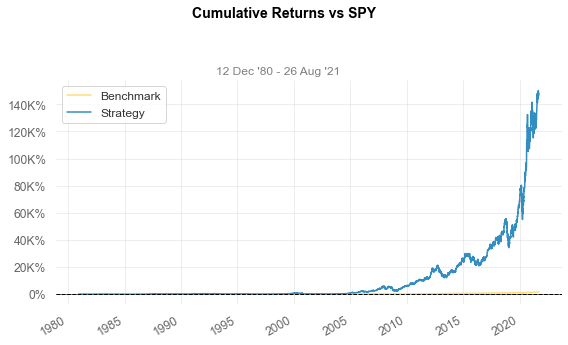

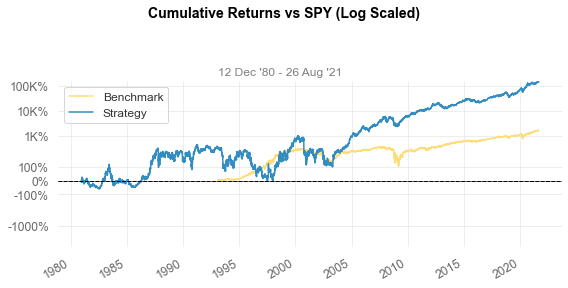

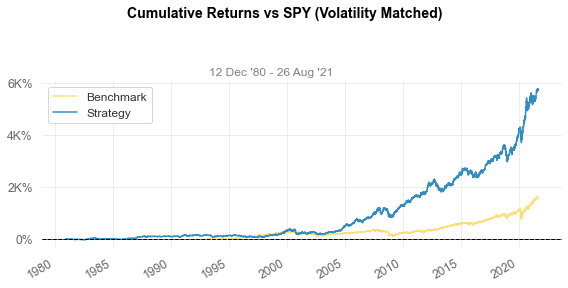

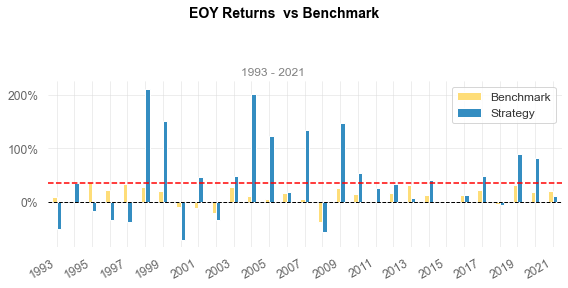

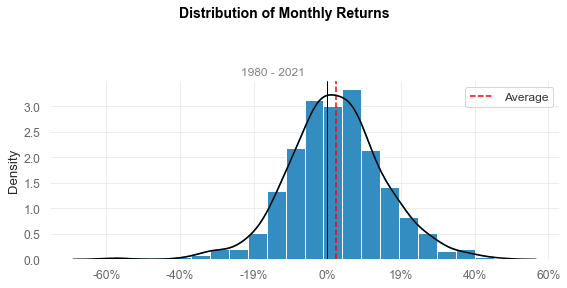

...

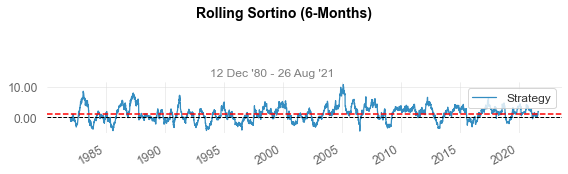

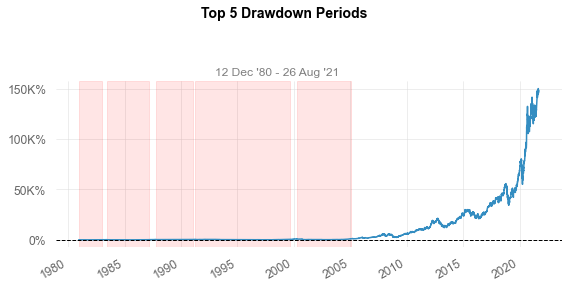

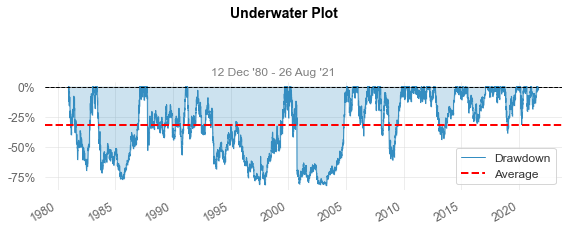

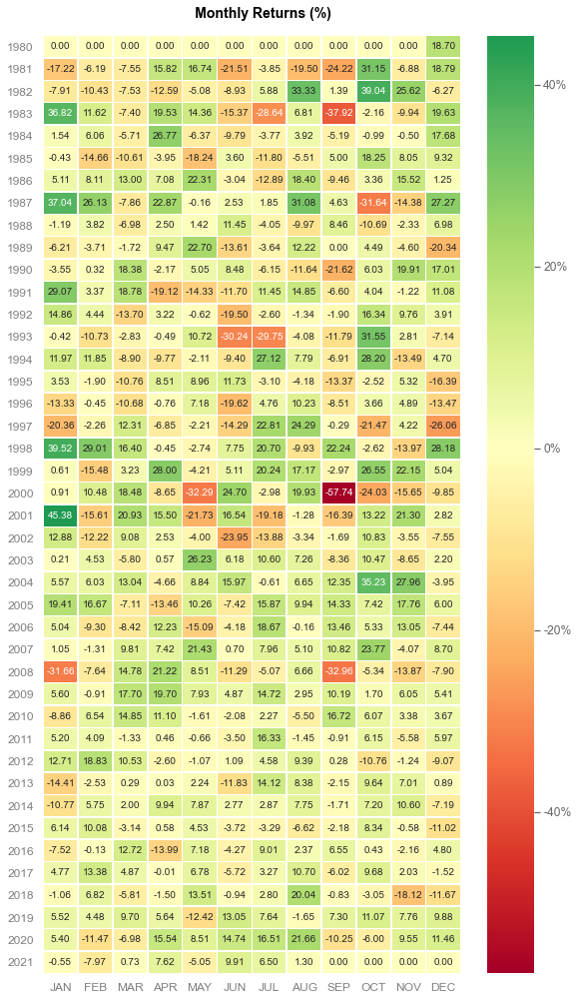

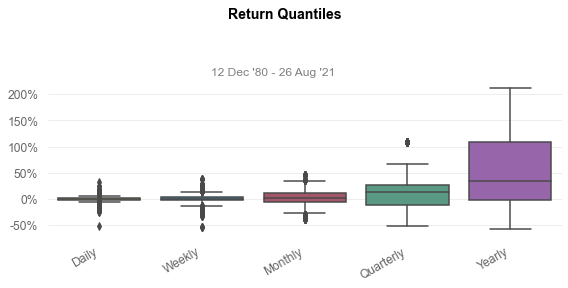

In [6]:
# Generate plots/ Using SPY (S&P500) as benchmark 

qs.extend_pandas()

AAPL = qs.utils.download_returns('AAPL')

qs.reports.full(AAPL, "SPY")

## ABBV -AbbVie 

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               2013-01-02  2013-01-02
End Period                 2021-08-26  2021-08-26
Risk-Free Rate             0.0%        0.0%
Time in Market             100.0%      100.0%

Cumulative Return          390.86%     268.8%
CAGR%                      20.19%      16.28%

Sharpe                     0.8         1.0
Sortino                    1.13        1.38
Sortino/√2                 0.8         0.98

Max Drawdown               -45.09%     -33.72%
Longest DD Days            1040        272
Volatility (ann.)          27.86%      16.55%
R^2                        0.28        0.28
Calmar                     0.45        0.48
Skew                       -0.53       -0.73
Kurtosis                   10.14       18.46

Expected Daily %           0.07%       0.06%
Expected Monthly %         1.54%       1.26%
Expected Yearly %          19.34%      15.6%
Kelly Criterion            4.88%  

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2018-01-29,2019-08-15,2020-12-04,1040,-45.089762,-43.128060
2,2015-07-29,2015-10-22,2017-05-02,643,-31.608195,-25.887949
3,2014-12-08,2015-02-09,2015-06-18,192,-19.815665,-19.584408
4,2013-12-19,2014-01-27,2014-05-19,151,-13.105774,-12.328125
5,2013-05-20,2013-06-20,2013-09-17,120,-12.953138,-12.359533


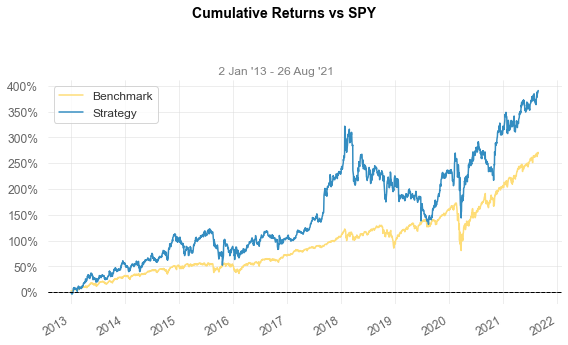

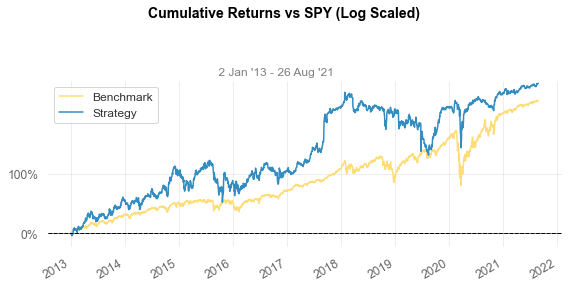

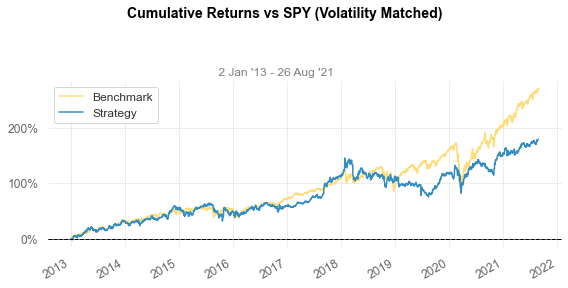

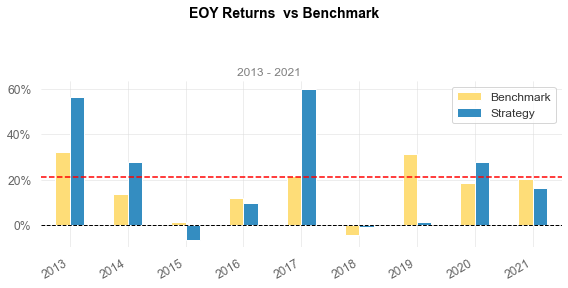

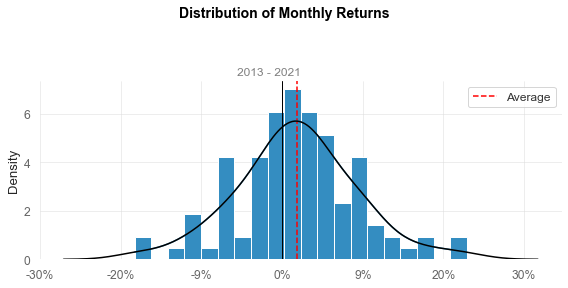

...

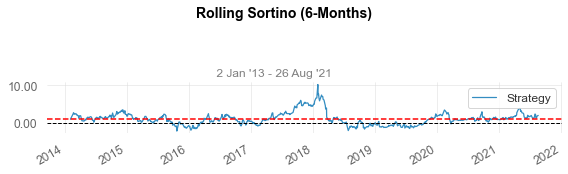

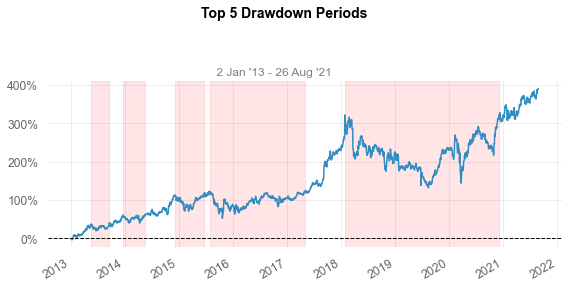

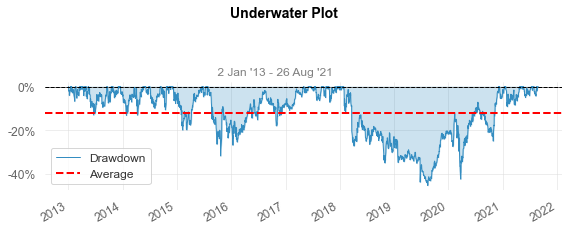

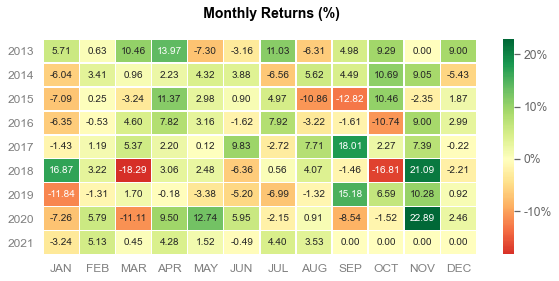

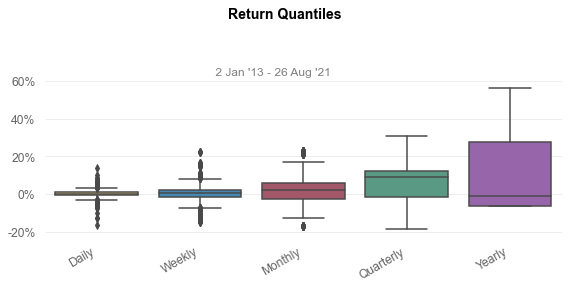

In [7]:
# Generate plots/ Using SPY (S&P500) as benchmark 

qs.extend_pandas()

ABBV = qs.utils.download_returns('ABBV')

qs.reports.full(ABBV, "SPY")

## PFE - PFIZER

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               1972-06-01  1972-06-01
End Period                 2021-08-26  2021-08-26
Risk-Free Rate             0.0%        0.0%
Time in Market             91.0%       58.0%

Cumulative Return          25,663.14%  1,629.71%
CAGR%                      11.93%      5.96%

Sharpe                     0.55        0.48
Sortino                    0.8         0.68
Sortino/√2                 0.57        0.48

Max Drawdown               -69.25%     -55.19%
Longest DD Days            5328        2404
Volatility (ann.)          27.54%      14.3%
R^2                        0.16        0.16
Calmar                     0.17        0.11
Skew                       -0.01       -0.01
Kurtosis                   3.83        23.09

Expected Daily %           0.04%       0.02%
Expected Monthly %         0.94%       0.48%
Expected Yearly %          11.74%      5.87%
Kelly Criterion            2.2% 

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,1999-04-13,2009-03-02,2013-11-13,5328,-69.250792,-63.343564
2,1973-07-26,1974-10-04,1980-06-05,2506,-57.632059,-51.754678
3,1987-08-14,1987-12-15,1989-11-10,819,-44.661143,-40.691911
4,2018-12-03,2020-03-23,2020-12-02,730,-35.432351,-31.058344
5,1992-01-10,1993-02-22,1995-01-18,1104,-35.334565,-33.080048


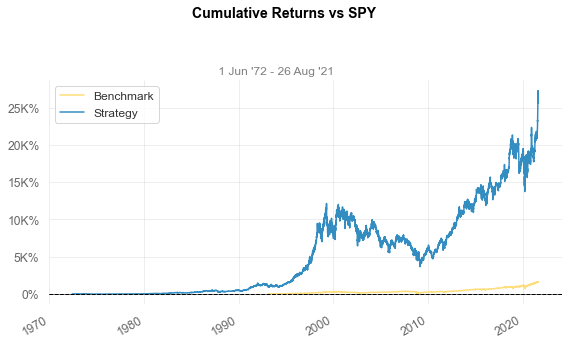

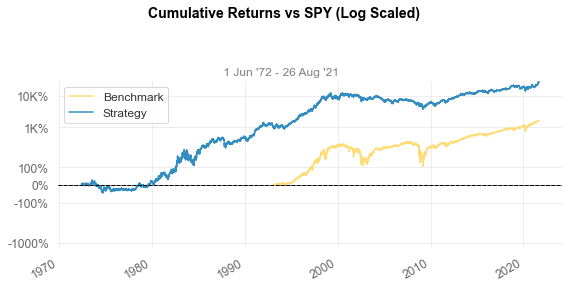

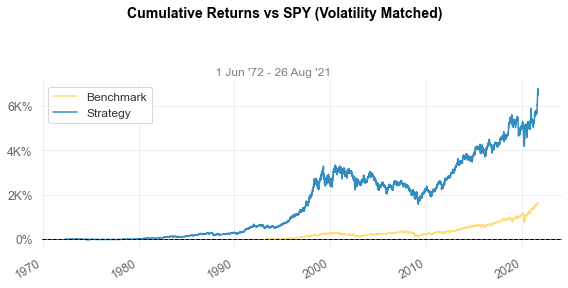

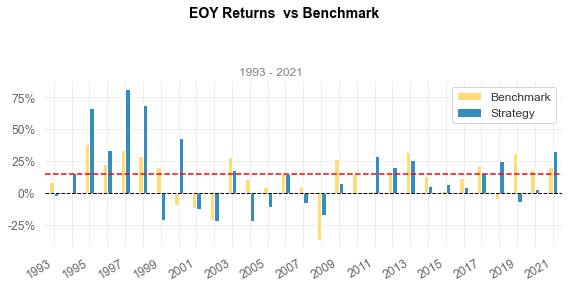

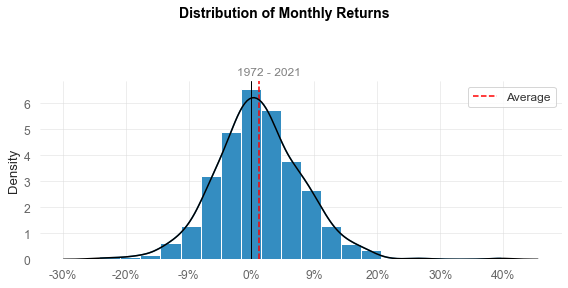

...

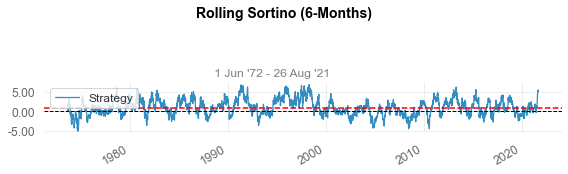

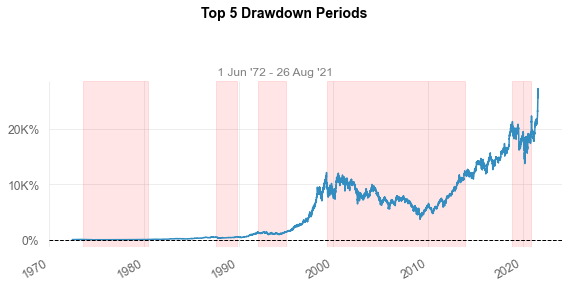

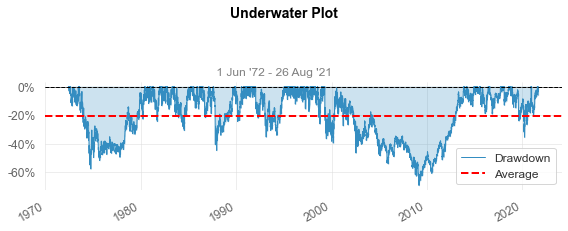

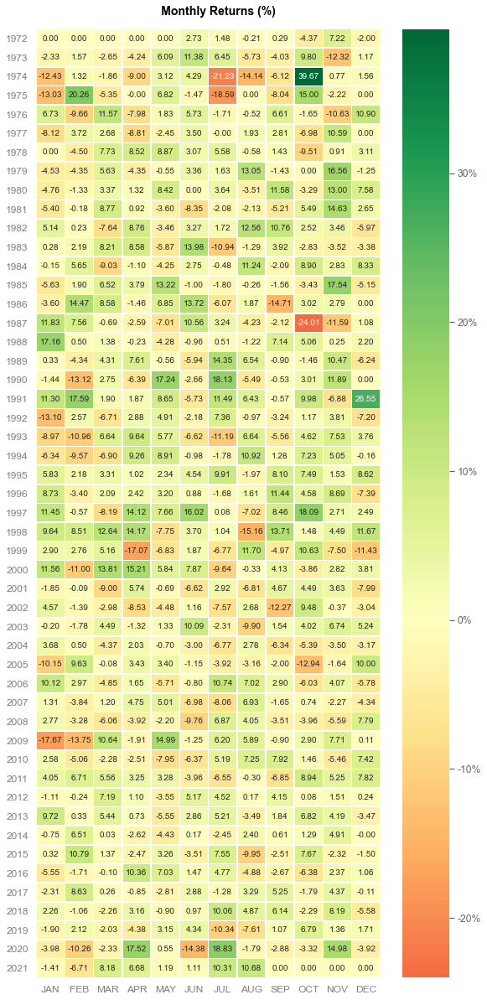

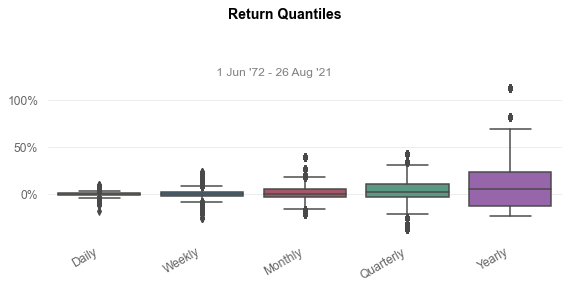

In [8]:
# Generate plots/ Using SPY (S&P500) as benchmark 

qs.extend_pandas()

PFE = qs.utils.download_returns('PFE')

qs.reports.full(PFE, "SPY")

## BAC - Bank of America

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               1973-02-21  1973-02-21
End Period                 2021-08-26  2021-08-26
Risk-Free Rate             0.0%        0.0%
Time in Market             90.0%       59.0%

Cumulative Return          2,393.96%   1,629.71%
CAGR%                      6.85%       6.05%

Sharpe                     0.36        0.48
Sortino                    0.54        0.68
Sortino/√2                 0.38        0.48

Max Drawdown               -93.45%     -55.19%
Longest DD Days            4959        2404
Volatility (ann.)          38.38%      14.42%
R^2                        0.3         0.3
Calmar                     0.07        0.11
Skew                       0.67        -0.01
Kurtosis                   25.82       22.63

Expected Daily %           0.03%       0.02%
Expected Monthly %         0.55%       0.49%
Expected Yearly %          6.78%       5.99%
Kelly Criterion            0.22%

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2007-10-08,2009-03-06,2021-05-06,4959,-93.445710,-88.511219
2,1973-10-22,1974-12-20,1985-05-20,4228,-84.226184,-81.249996
3,1989-08-08,1990-10-30,1992-05-13,1009,-67.754462,-63.723780
4,1998-07-15,2000-12-06,2002-05-17,1402,-52.846370,-50.442151
5,1987-08-27,1987-12-03,1988-08-02,341,-41.200045,-39.716394


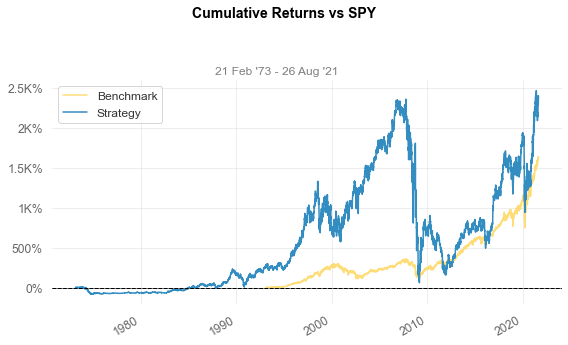

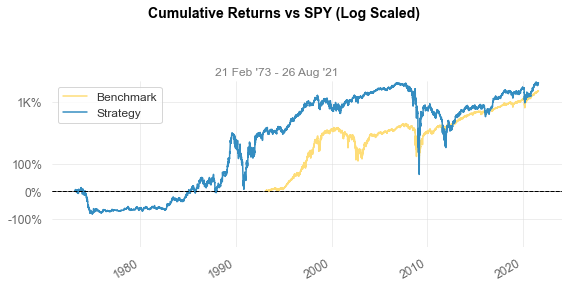

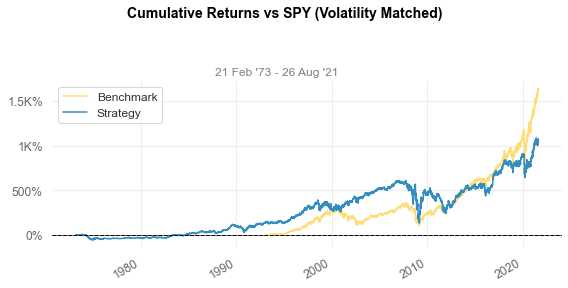

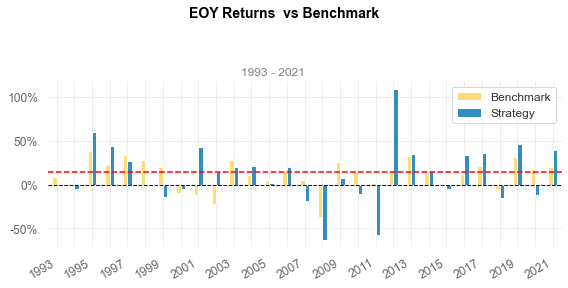

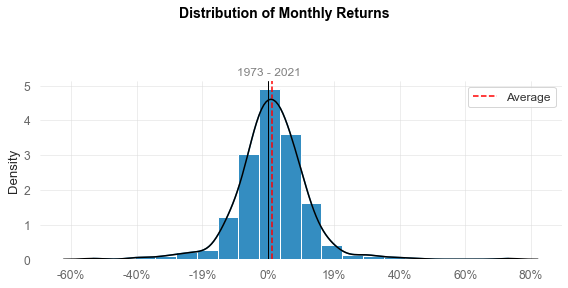

...

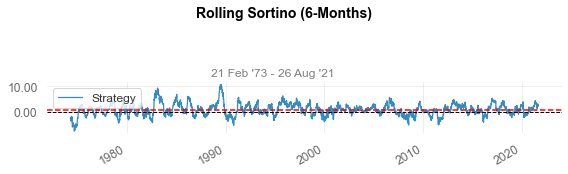

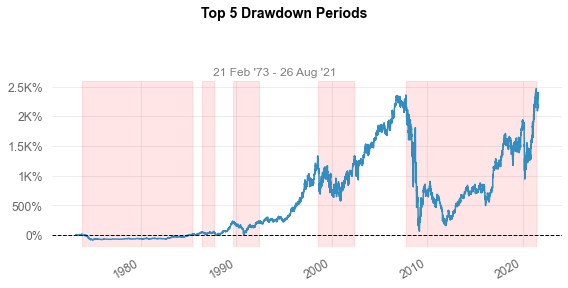

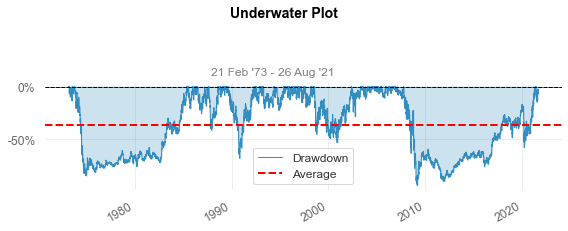

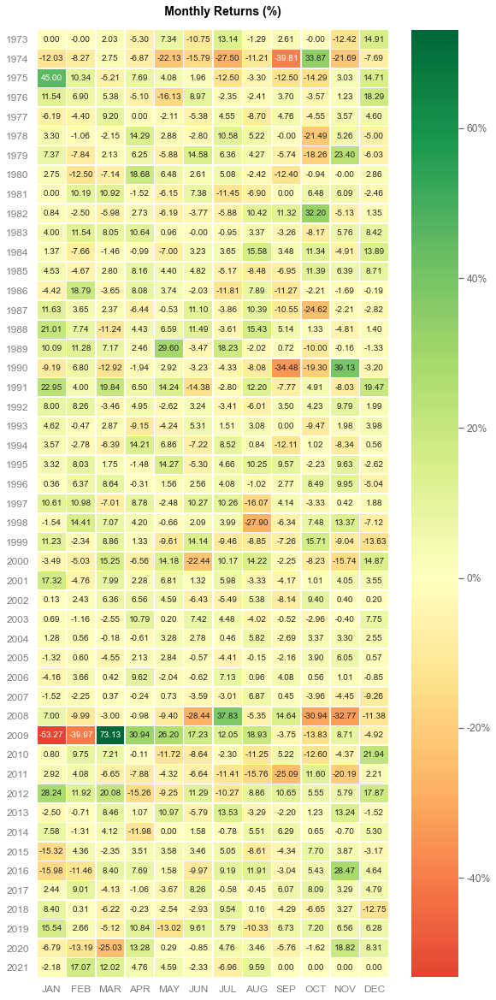

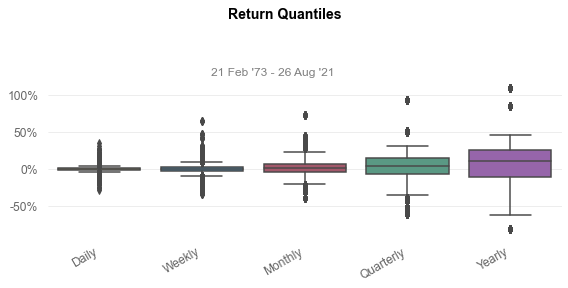

In [9]:
# Generate plots/ Using SPY (S&P500) as benchmark 

qs.extend_pandas()

BAC = qs.utils.download_returns('BAC')

qs.reports.full(BAC, "SPY")

## COKE - Coca Cola

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               1973-02-21  1973-02-21
End Period                 2021-08-26  2021-08-26
Risk-Free Rate             0.0%        0.0%
Time in Market             83.0%       63.0%

Cumulative Return          6,314.80%   1,678.44%
CAGR%                      8.95%       6.11%

Sharpe                     0.44        0.5
Sortino                    0.65        0.71
Sortino/√2                 0.46        0.5

Max Drawdown               -85.29%     -55.19%
Longest DD Days            3882        2404
Volatility (ann.)          34.57%      14.89%
R^2                        0.05        0.05
Calmar                     0.1         0.11
Skew                       0.4         -0.01
Kurtosis                   9.52        21.07

Expected Daily %           0.04%       0.03%
Expected Monthly %         0.72%       0.49%
Expected Yearly %          8.86%       6.05%
Kelly Criterion            1.09% 

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,1973-02-23,1974-12-27,1982-04-26,3349,-85.294124,-81.372546
2,1986-03-13,1990-11-08,1996-10-28,3882,-68.710477,-66.797709
3,1998-08-10,2000-11-08,2003-01-03,1607,-54.322494,-51.862101
4,2019-05-14,2020-03-20,2021-05-27,744,-51.711825,-49.597952
5,2007-01-03,2008-08-04,2011-03-22,1539,-51.061671,-49.217891


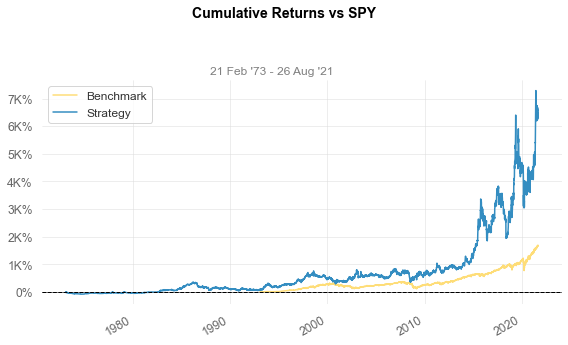

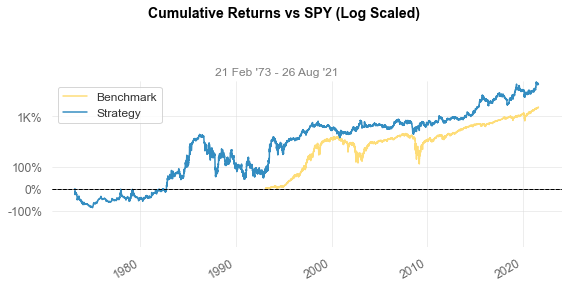

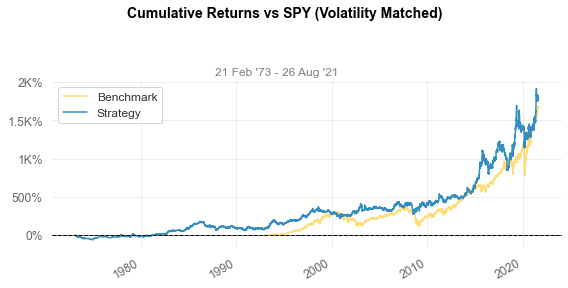

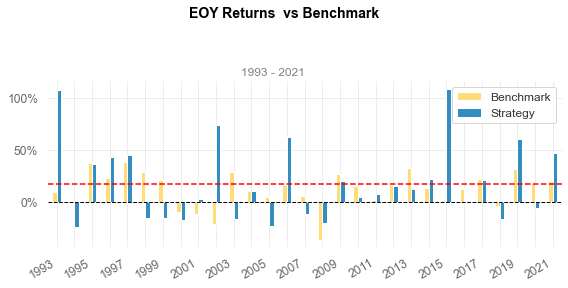

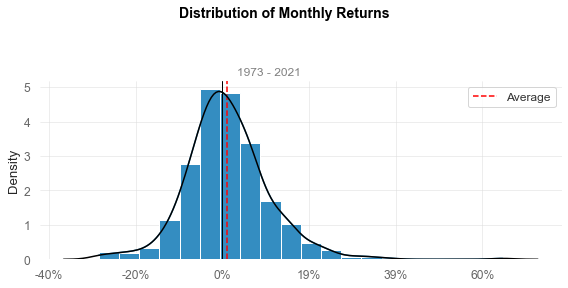

...

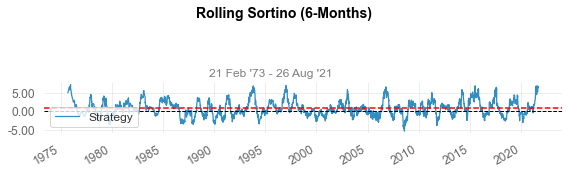

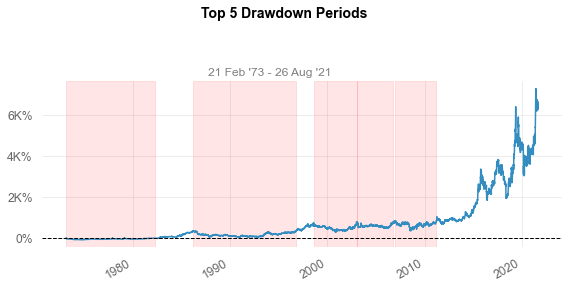

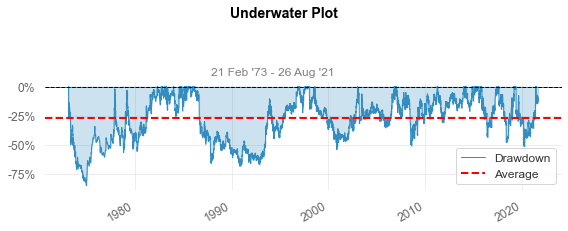

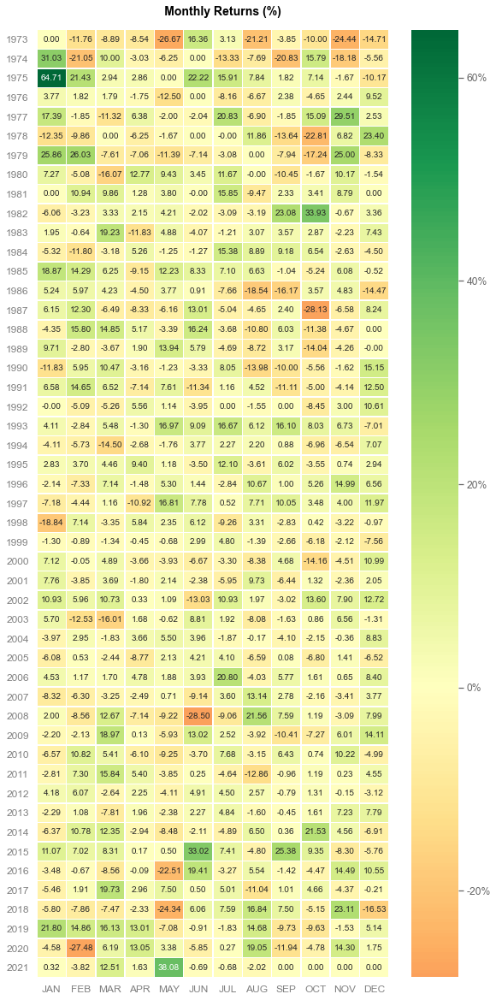

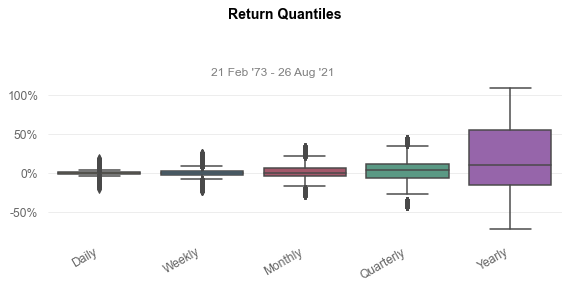

In [10]:
# Generate plots/ Using SPY (S&P500) as benchmark 

qs.extend_pandas()

COKE = qs.utils.download_returns('COKE')

qs.reports.full(COKE, "SPY")

## SQ - Square

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               2015-11-19  2015-11-19
End Period                 2021-08-26  2021-08-26
Risk-Free Rate             0.0%        0.0%
Time in Market             100.0%      100.0%

Cumulative Return          1,905.59%   138.43%
CAGR%                      68.11%      16.24%

Sharpe                     1.24        0.92
Sortino                    1.79        1.27
Sortino/√2                 1.27        0.9

Max Drawdown               -61.53%     -33.72%
Longest DD Days            630         203
Volatility (ann.)          53.68%      18.21%
R^2                        0.3         0.3
Calmar                     1.11        0.48
Skew                       -0.57       -0.77
Kurtosis                   6.95        18.37

Expected Daily %           0.21%       0.06%
Expected Monthly %         4.38%       1.25%
Expected Yearly %          53.47%      13.22%
Kelly Criterion            7.77% 

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2018-10-01,2020-03-20,2020-06-22,630,-61.529139,-55.842844
2,2016-04-13,2016-06-27,2017-02-23,316,-44.315245,-42.571056
3,2016-01-04,2016-02-08,2016-03-21,77,-36.058061,-35.599693
4,2017-11-27,2017-12-29,2018-03-05,98,-29.042166,-28.264431
5,2021-02-22,2021-05-13,2021-08-05,164,-28.723289,-27.645806


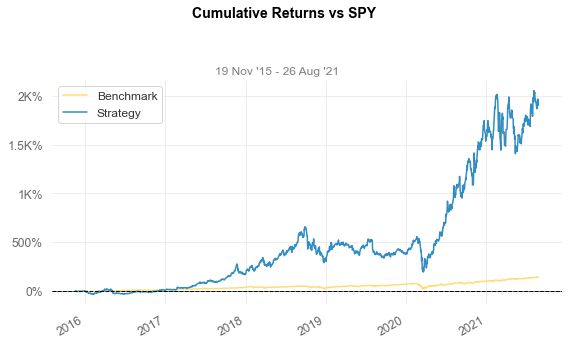

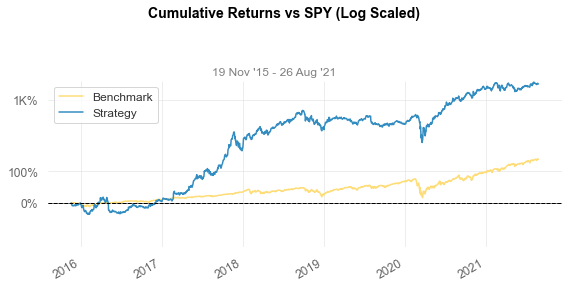

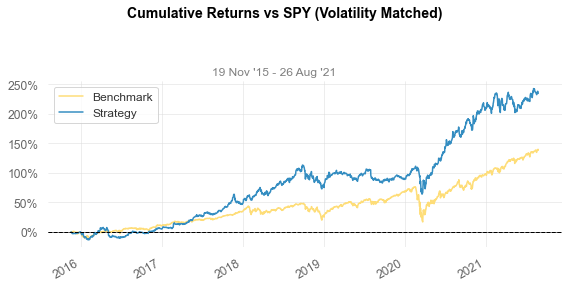

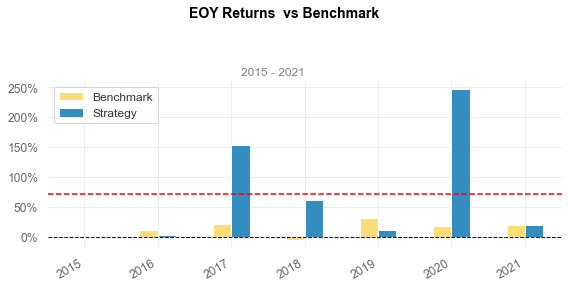

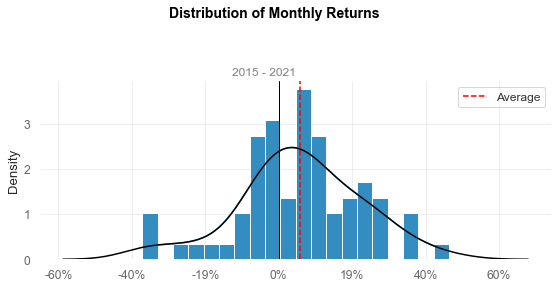

...

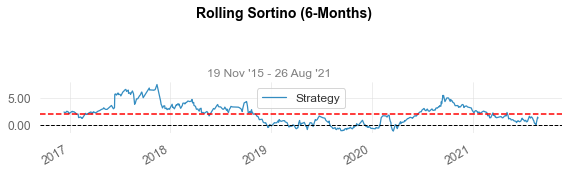

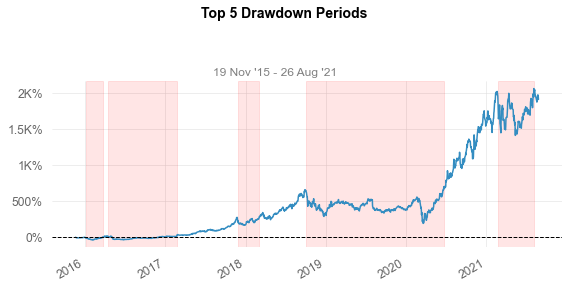

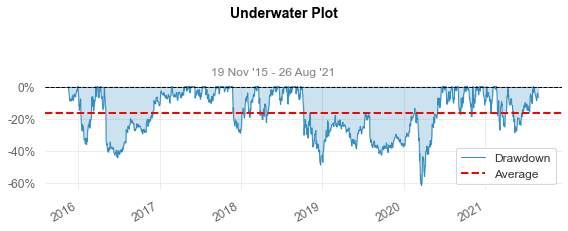

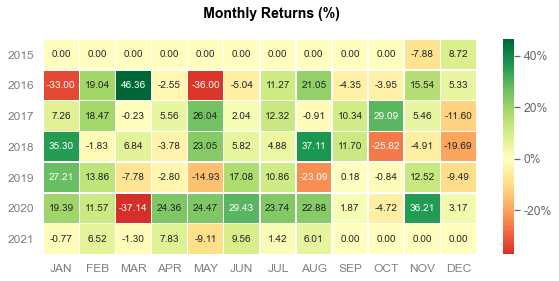

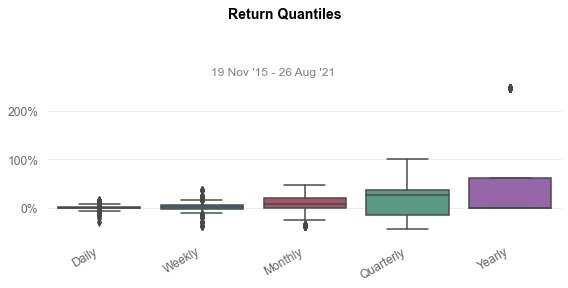

In [11]:
# Generate plots/ Using SPY (S&P500) as benchmark 

qs.extend_pandas()

SQ = qs.utils.download_returns('SQ')

qs.reports.full(SQ, "SPY")

## AMD - Advanced Micro Devices

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               1980-03-17  1980-03-17
End Period                 2021-08-26  2021-08-26
Risk-Free Rate             0.0%        0.0%
Time in Market             95.0%       69.0%

Cumulative Return          3,309.91%   1,629.71%
CAGR%                      8.88%       7.12%

Sharpe                     0.44        0.52
Sortino                    0.65        0.74
Sortino/√2                 0.46        0.52

Max Drawdown               -96.59%     -55.19%
Longest DD Days            7133        2404
Volatility (ann.)          59.62%      15.58%
R^2                        0.15        0.15
Calmar                     0.09        0.13
Skew                       0.26        -0.02
Kurtosis                   10.03       18.97

Expected Daily %           0.03%       0.03%
Expected Monthly %         0.71%       0.57%
Expected Yearly %          8.77%       7.02%
Kelly Criterion            -0.8

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2000-06-22,2015-07-27,2020-01-02,7133,-96.589474,-96.063158
2,1984-08-24,1990-10-17,1997-03-11,4582,-90.853659,-89.329268
3,1997-03-14,1998-08-31,2000-03-06,1088,-72.559367,-68.205805
4,1980-11-21,1981-09-25,1983-01-14,784,-66.477276,-63.636358
5,2020-02-20,2020-03-16,2020-07-22,153,-34.278441,-33.582346


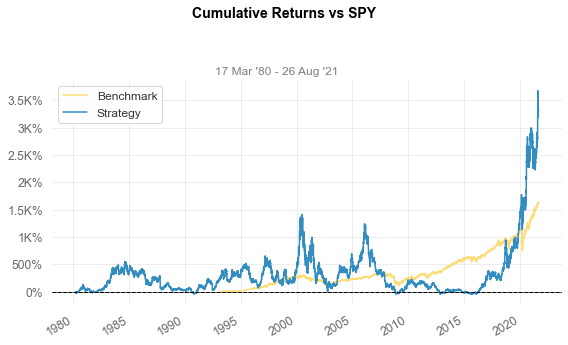

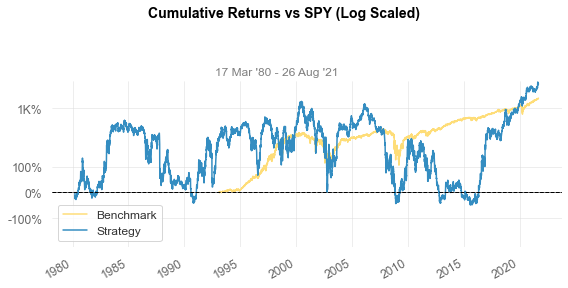

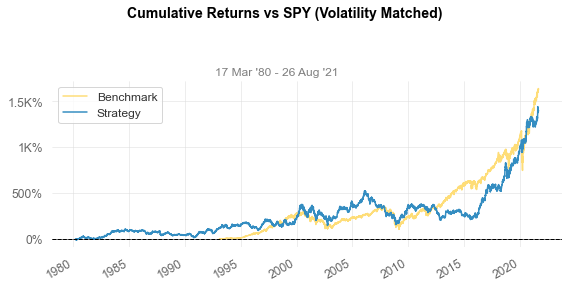

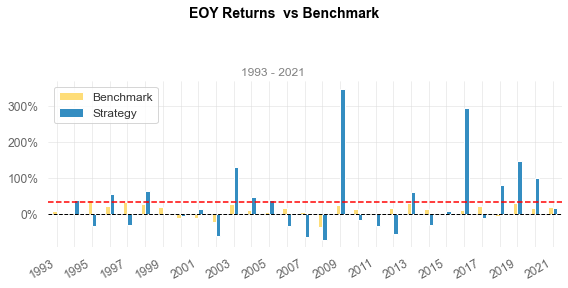

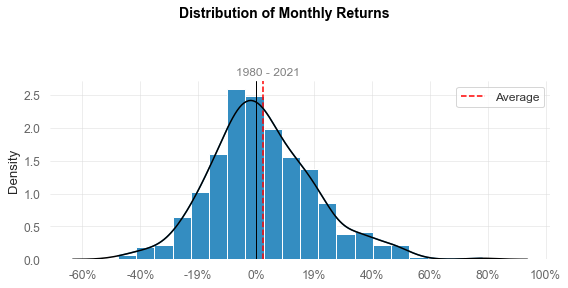

...

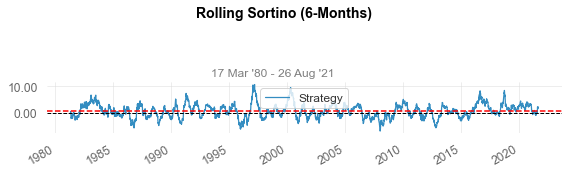

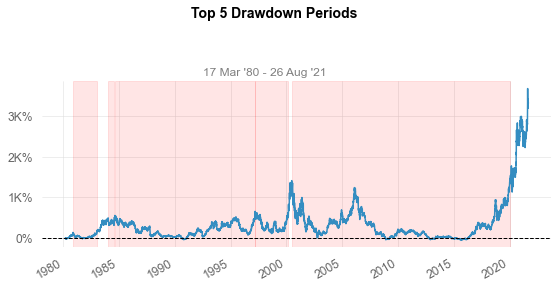

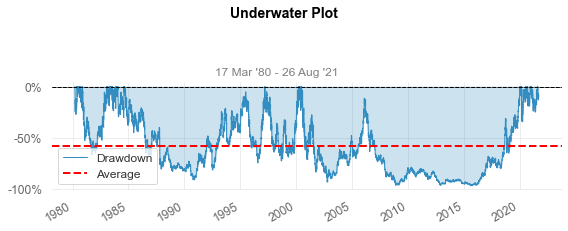

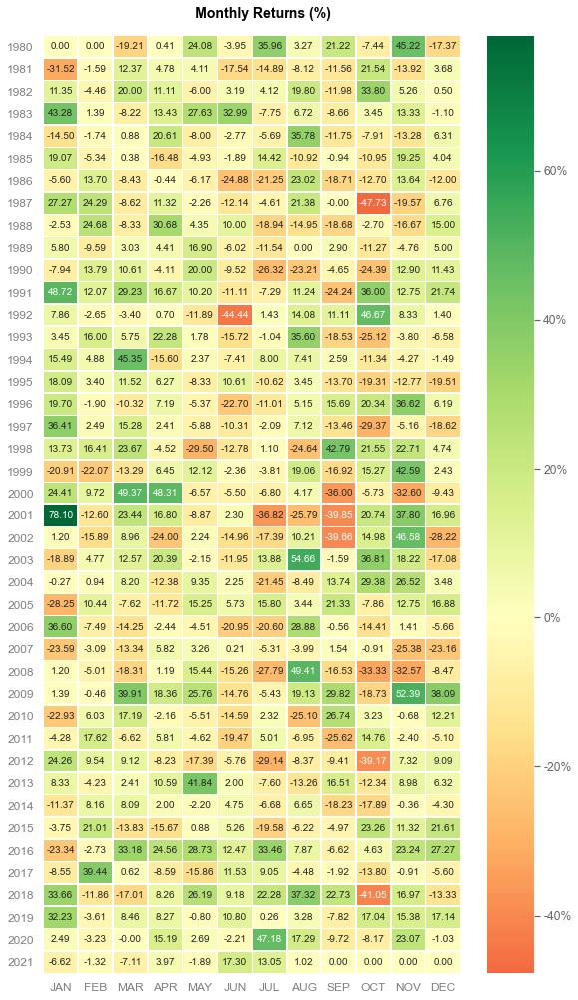

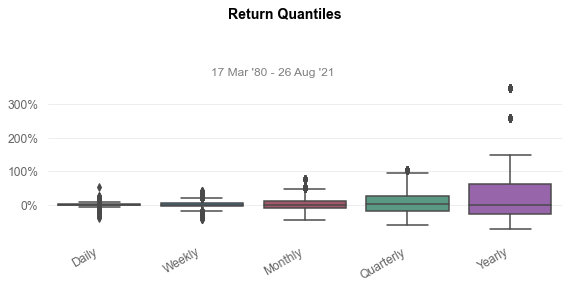

In [12]:
# Generate plots/ Using SPY (S&P500) as benchmark 

qs.extend_pandas()

AMD = qs.utils.download_returns('AMD')

qs.reports.full(AMD, "SPY")

## FDX - FedEX Corporation

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               1978-04-12  1978-04-12
End Period                 2021-08-26  2021-08-26
Risk-Free Rate             0.0%        0.0%
Time in Market             97.0%       66.0%

Cumulative Return          32,028.46%  1,629.71%
CAGR%                      14.22%      6.79%

Sharpe                     0.56        0.51
Sortino                    0.84        0.72
Sortino/√2                 0.59        0.51

Max Drawdown               -71.32%     -55.19%
Longest DD Days            2397        2404
Volatility (ann.)          33.84%      15.23%
R^2                        0.19        0.19
Calmar                     0.2         0.12
Skew                       0.13        -0.02
Kurtosis                   4.41        20.0

Expected Daily %           0.05%       0.03%
Expected Monthly %         1.11%       0.55%
Expected Yearly %          14.02%      6.69%
Kelly Criterion            -0.12

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2007-02-26,2009-03-09,2013-09-19,2397,-71.316891,-63.543666
2,2018-01-22,2020-03-16,2020-10-07,989,-65.966494,-58.922094
3,1987-10-14,1990-11-30,1994-01-13,2283,-60.364845,-56.716424
4,1999-05-14,2000-03-07,2003-05-05,1452,-49.696371,-45.141719
5,1997-09-23,1998-10-01,1998-12-21,454,-46.252811,-44.738850


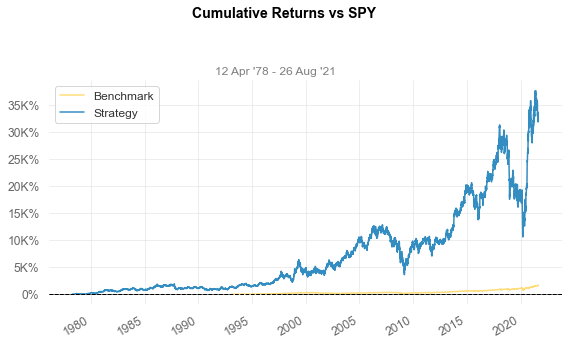

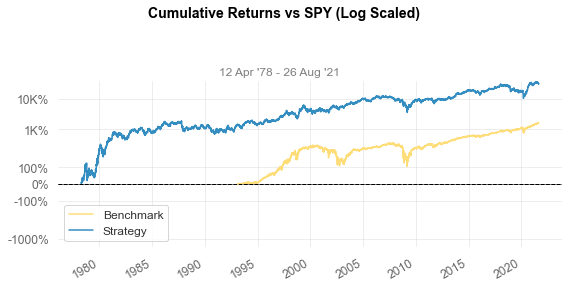

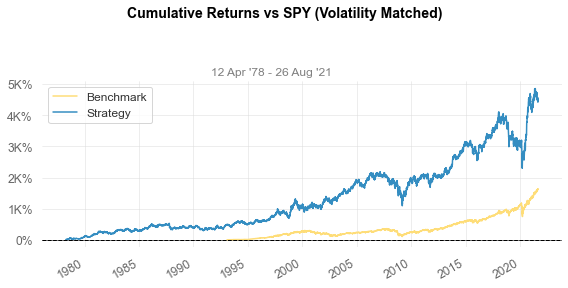

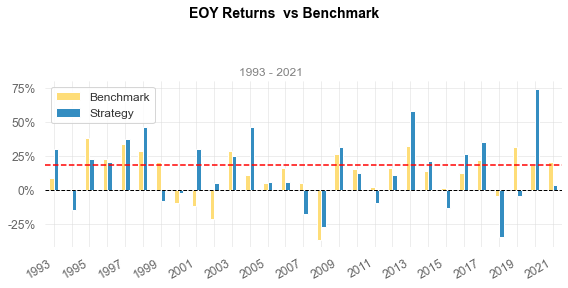

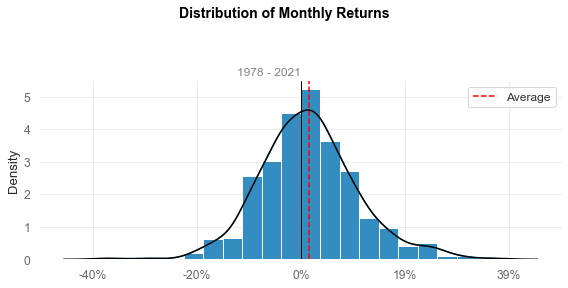

...

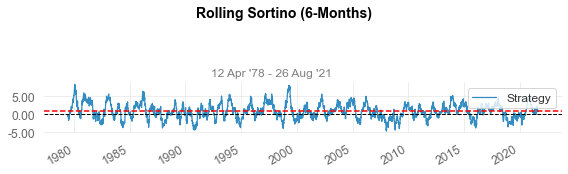

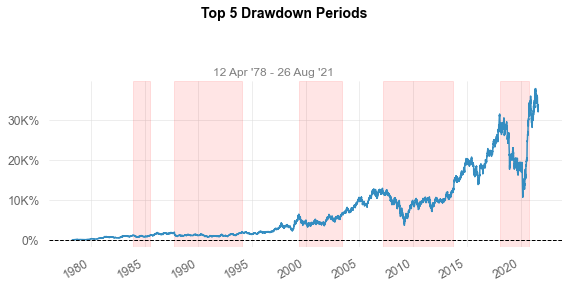

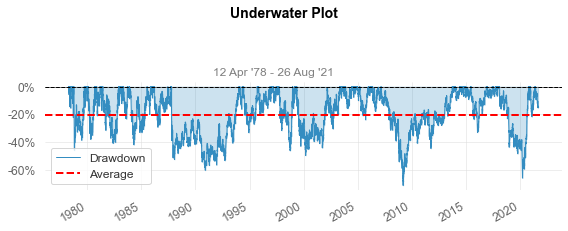

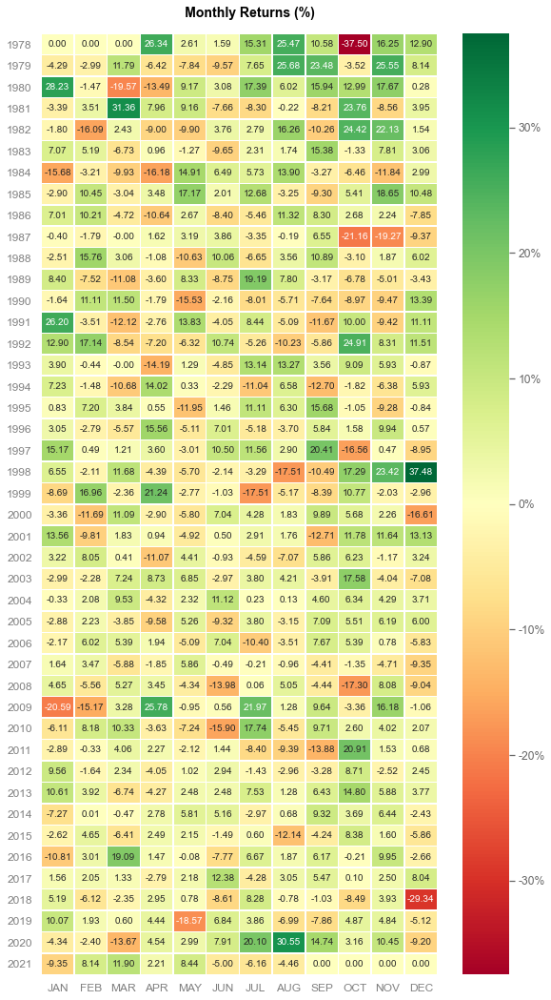

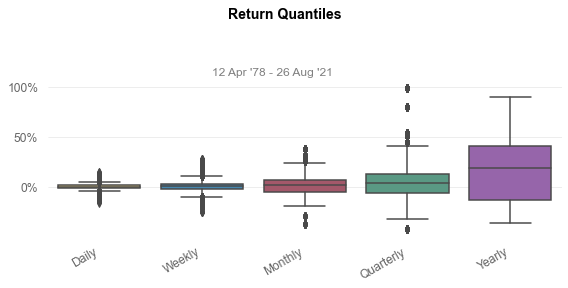

In [13]:
# Generate plots/ Using SPY (S&P500) as benchmark 

qs.extend_pandas()

FDX = qs.utils.download_returns('FDX')

qs.reports.full(FDX, "SPY")

## EBAY - Ebay


                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               1998-09-24  1998-09-24
End Period                 2021-08-26  2021-08-26
Risk-Free Rate             0.0%        0.0%
Time in Market             100.0%      100.0%

Cumulative Return          9,333.21%   530.86%
CAGR%                      21.92%      8.36%

Sharpe                     0.64        0.51
Sortino                    1.02        0.72
Sortino/√2                 0.72        0.51

Max Drawdown               -82.56%     -55.19%
Longest DD Days            3350        2404
Volatility (ann.)          51.66%      19.7%
R^2                        0.21        0.21
Calmar                     0.27        0.15
Skew                       1.71        0.01
Kurtosis                   21.01       11.74

Expected Daily %           0.08%       0.03%
Expected Monthly %         1.66%       0.67%
Expected Yearly %          20.86%      7.98%
Kelly Criterion            1.52%  

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2004-12-31,2009-03-09,2014-03-04,3350,-82.559225,-79.383544
2,2000-03-27,2000-12-20,2003-12-19,1362,-77.076919,-73.487179
3,1999-04-30,1999-08-04,2000-03-16,321,-64.767440,-60.755817
4,2018-02-02,2018-12-24,2020-05-29,847,-43.407660,-40.636495
5,1998-09-30,1998-10-08,1998-10-21,21,-40.664935,-39.897681


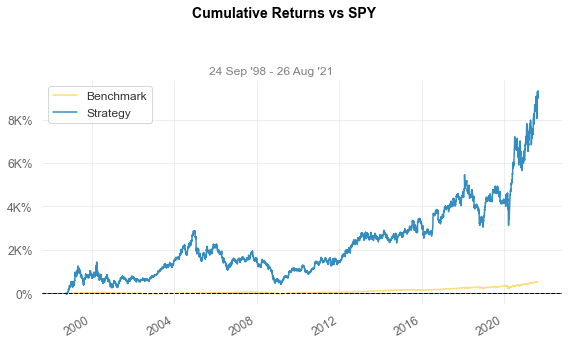

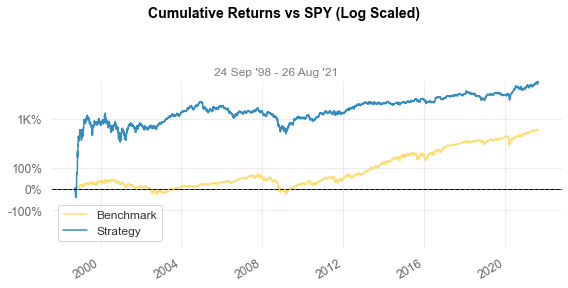

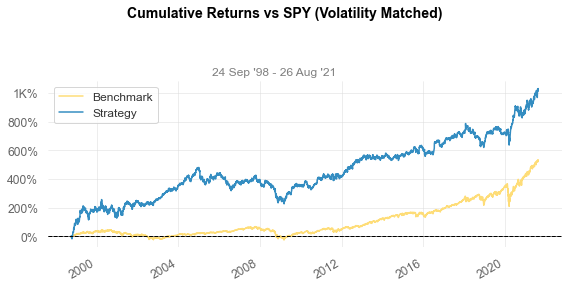

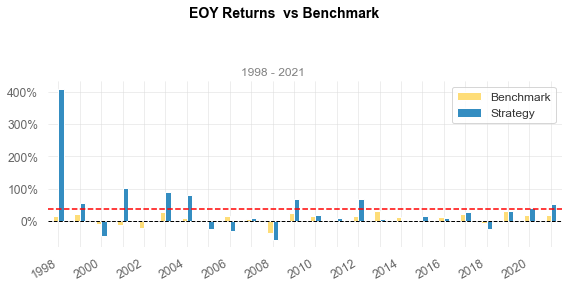

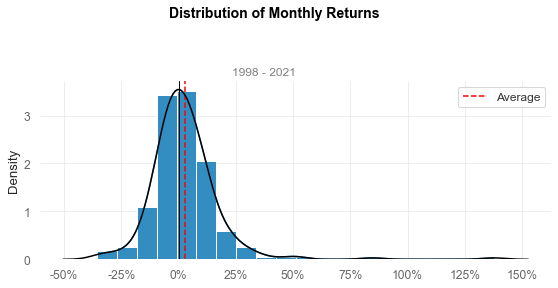

...

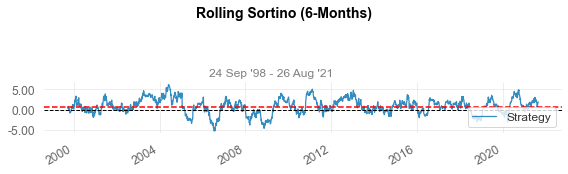

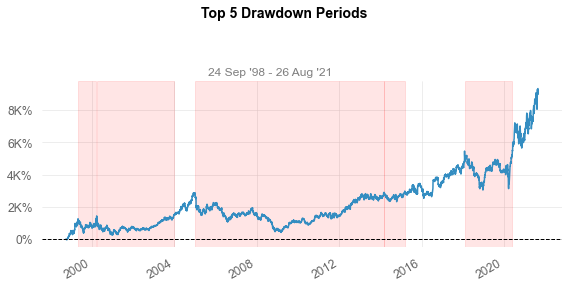

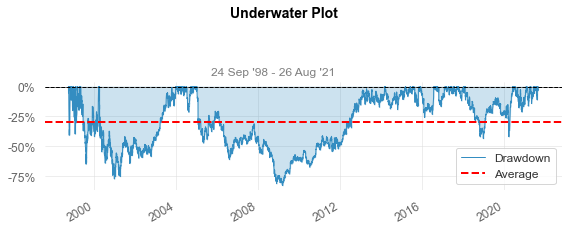

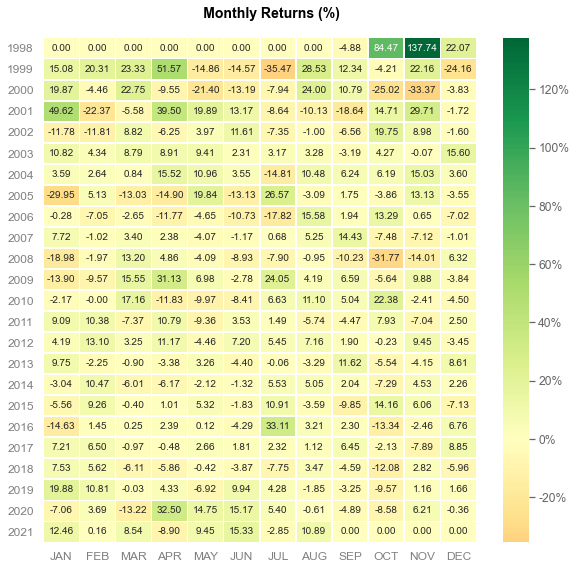

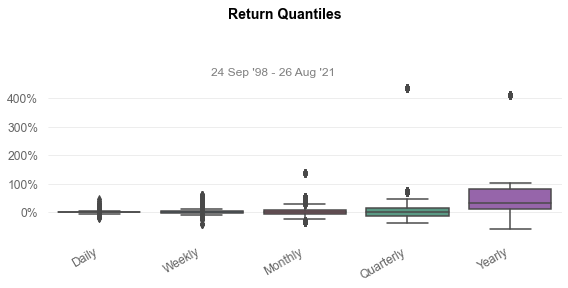

In [14]:
# Generate plots/ Using SPY (S&P500) as benchmark 

qs.extend_pandas()

EBAY = qs.utils.download_returns('EBAY')

qs.reports.full(EBAY, "SPY")

## AMZN - Amazon

                           Strategy     Benchmark
-------------------------  -----------  -----------
Start Period               1997-05-15   1997-05-15
End Period                 2021-08-26   2021-08-26
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          169,227.69%  722.56%
CAGR%                      35.79%       9.06%

Sharpe                     0.81         0.54
Sortino                    1.3          0.76
Sortino/√2                 0.92         0.54

Max Drawdown               -94.4%       -55.19%
Longest DD Days            3602         2404
Volatility (ann.)          58.06%       19.8%
R^2                        0.19         0.19
Calmar                     0.38         0.16
Skew                       1.06         -0.04
Kurtosis                   10.8         11.31

Expected Daily %           0.12%        0.03%
Expected Monthly %         2.58%        0.72%
Expected Yearly %          34.63%       8.79%
Kelly Criter

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,1999-12-13,2001-09-28,2009-10-23,3602,-94.404218,-93.035735
2,1999-04-26,1999-08-09,1999-12-10,228,-59.309935,-57.376562
3,1999-01-12,1999-02-18,1999-04-05,83,-51.523358,-49.356804
4,1998-07-07,1998-09-15,1998-11-17,133,-47.670250,-47.177419
5,2018-09-05,2018-12-24,2020-02-04,517,-34.103782,-27.879735


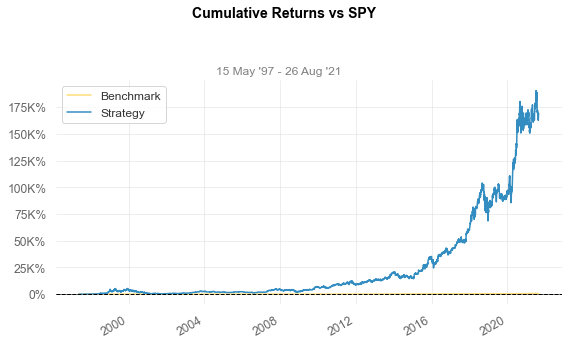

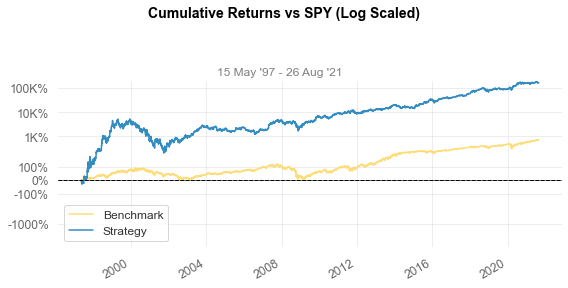

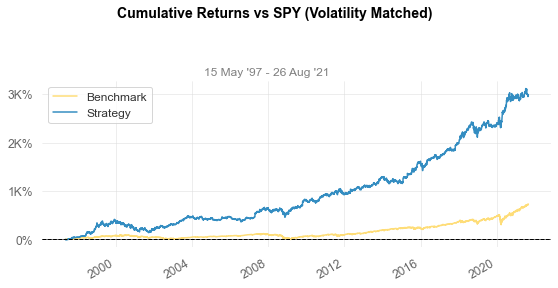

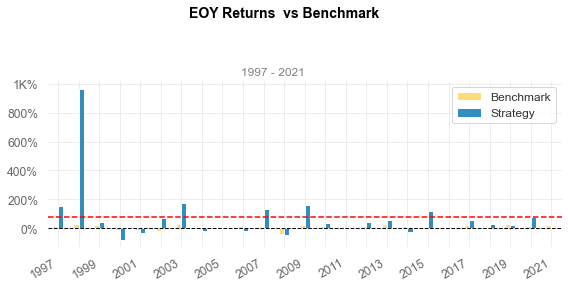

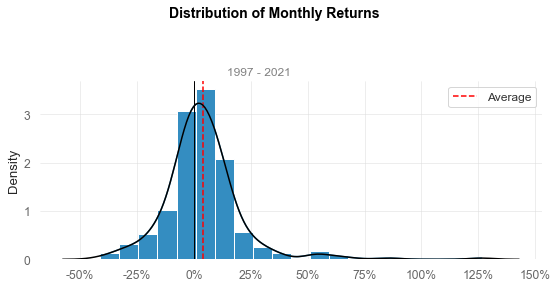

...

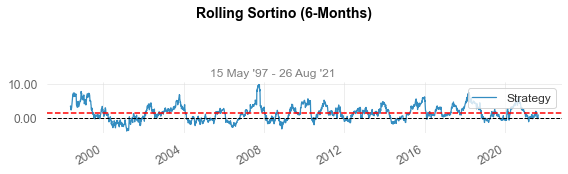

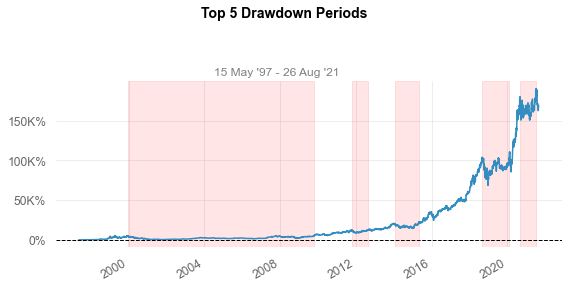

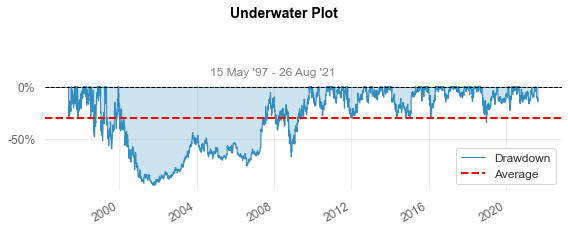

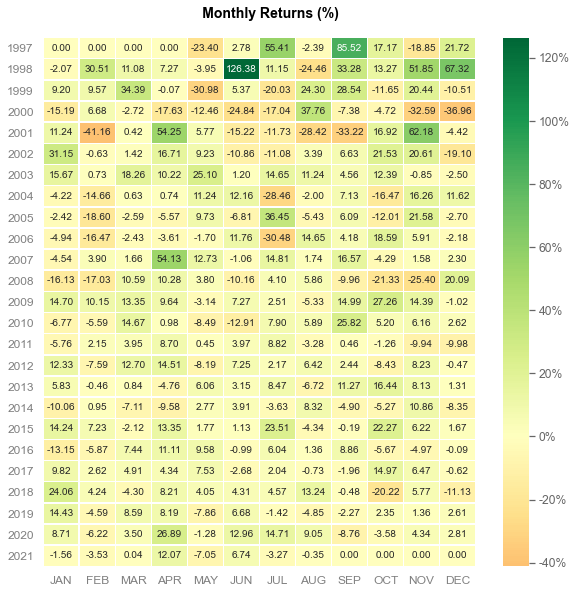

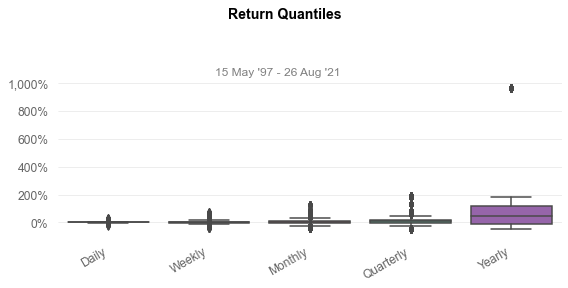

In [15]:
# Generate plots/ Using SPY (S&P500) as benchmark 

qs.extend_pandas()

AMZN = qs.utils.download_returns('AMZN')

qs.reports.full(AMZN, "SPY")

## C - Citigroup

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               1977-01-03  1977-01-03
End Period                 2021-08-26  2021-08-26
Risk-Free Rate             0.0%        0.0%
Time in Market             95.0%       64.0%

Cumulative Return          827.05%     1,629.71%
CAGR%                      5.11%       6.59%

Sharpe                     0.33        0.5
Sortino                    0.48        0.71
Sortino/√2                 0.34        0.5

Max Drawdown               -98.0%      -55.19%
Longest DD Days            5355        2404
Volatility (ann.)          40.64%      15.01%
R^2                        0.36        0.36
Calmar                     0.05        0.12
Skew                       1.08        -0.01
Kurtosis                   49.17       20.66

Expected Daily %           0.02%       0.03%
Expected Monthly %         0.42%       0.53%
Expected Yearly %          5.07%       6.54%
Kelly Criterion            -1.04%

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2006-12-28,2009-03-05,2021-08-26,5355,-98.000245,-95.014875
2,1987-02-25,1990-10-09,1992-11-27,2102,-62.461676,-60.115528
3,1998-04-07,1998-10-07,1999-04-08,366,-56.334707,-52.079918
4,2000-08-29,2002-07-23,2004-03-30,1309,-53.112976,-48.231986
5,1981-04-08,1982-03-03,1983-05-24,776,-41.643121,-39.943391


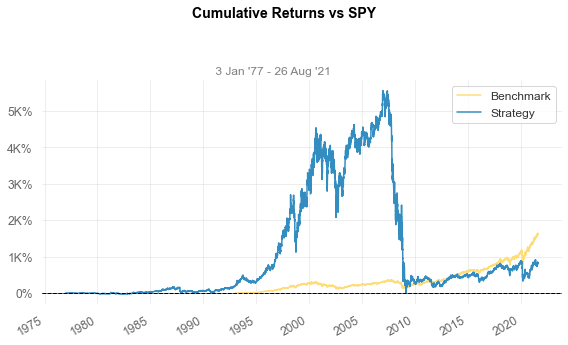

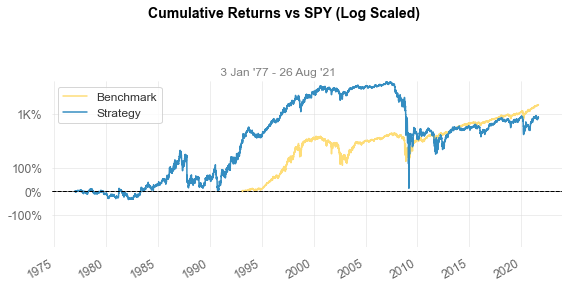

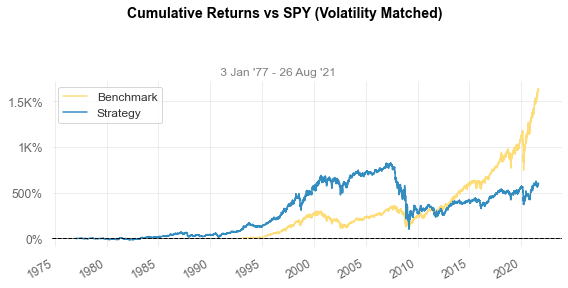

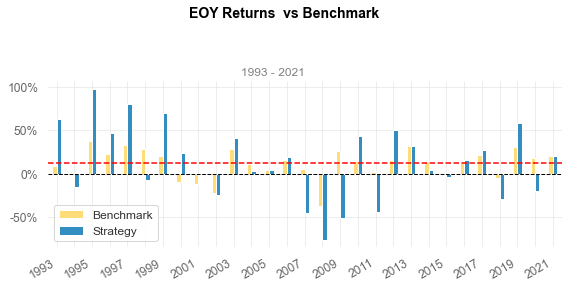

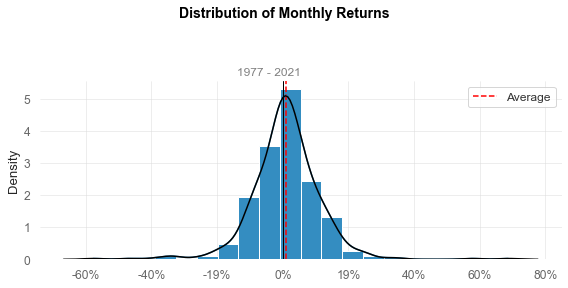

...

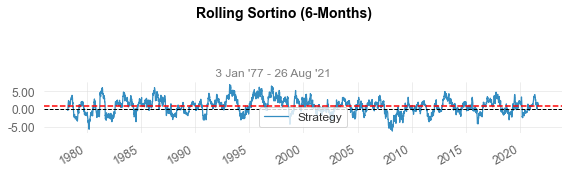

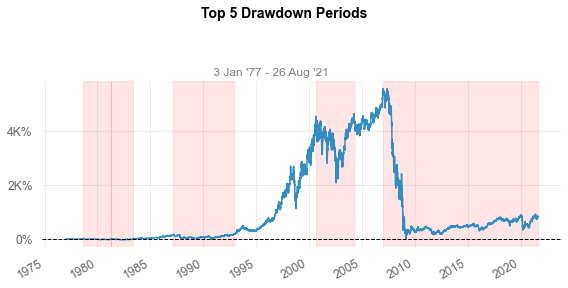

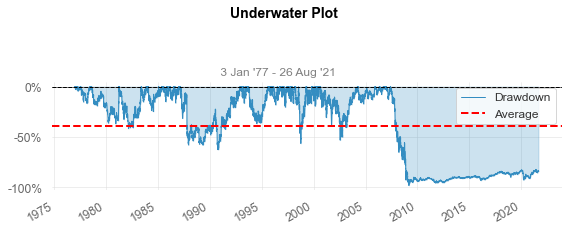

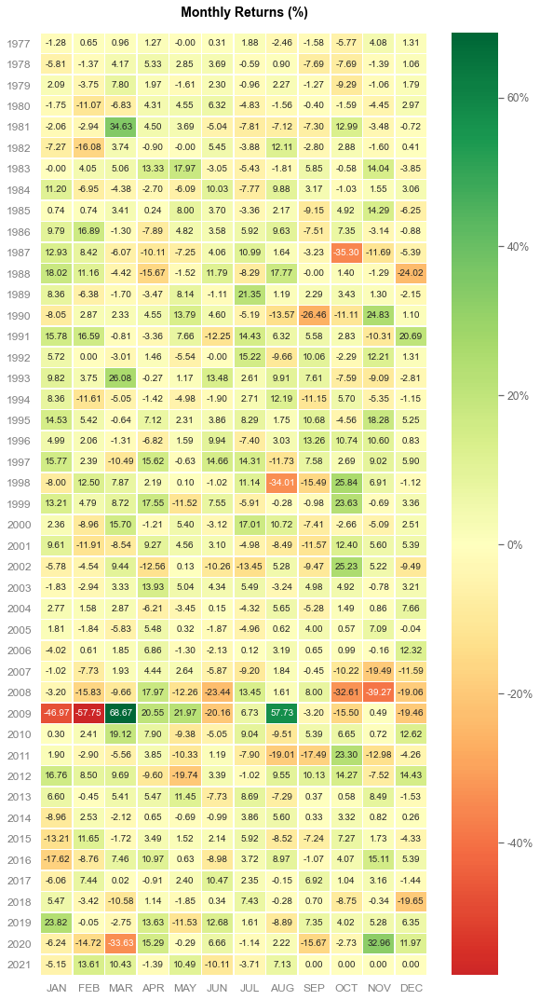

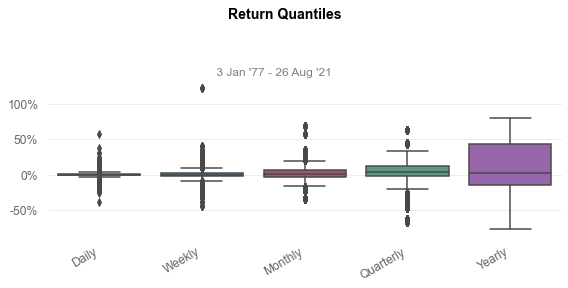

In [16]:
# Generate plots/ Using SPY (S&P500) as benchmark 

qs.extend_pandas()

C = qs.utils.download_returns('C')

qs.reports.full(C, "SPY")

## F - Ford Motor

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               1972-06-01  1972-06-01
End Period                 2021-08-26  2021-08-26
Risk-Free Rate             0.0%        0.0%
Time in Market             95.0%       58.0%

Cumulative Return          4,550.22%   1,629.71%
CAGR%                      8.1%        5.96%

Sharpe                     0.4         0.48
Sortino                    0.59        0.68
Sortino/√2                 0.42        0.48

Max Drawdown               -95.49%     -55.19%
Longest DD Days            8150        2404
Volatility (ann.)          35.39%      14.3%
R^2                        0.2         0.2
Calmar                     0.08        0.11
Skew                       0.56        -0.01
Kurtosis                   14.59       23.09

Expected Daily %           0.03%       0.02%
Expected Monthly %         0.65%       0.48%
Expected Yearly %          7.98%       5.87%
Kelly Criterion            0.69% 

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,1999-05-04,2008-11-19,2021-08-26,8150,-95.487561,-92.479268
2,1978-05-02,1981-10-29,1982-12-21,1694,-58.890228,-56.624369
3,1973-01-09,1974-10-28,1978-04-06,1913,-58.763855,-56.473005
4,1989-02-09,1991-01-09,1992-04-29,1175,-49.453442,-48.447576
5,1987-08-26,1987-10-26,1988-06-22,301,-39.081791,-35.498349


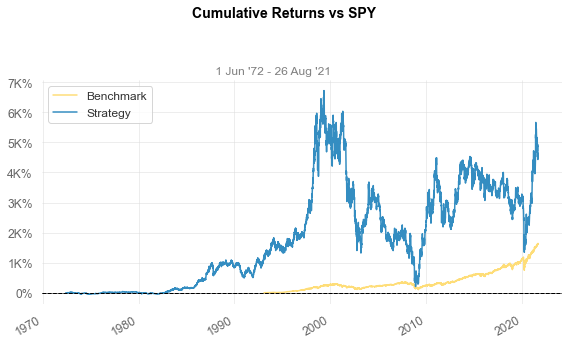

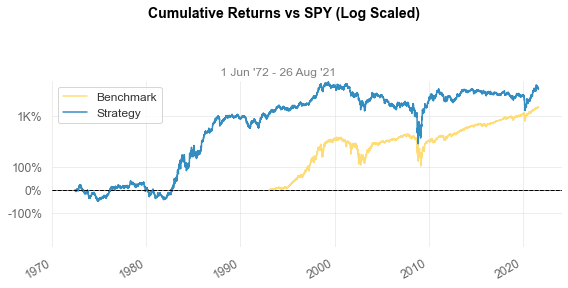

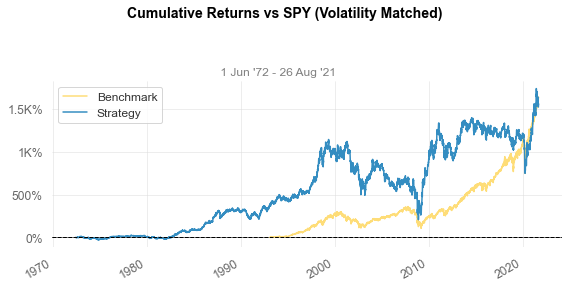

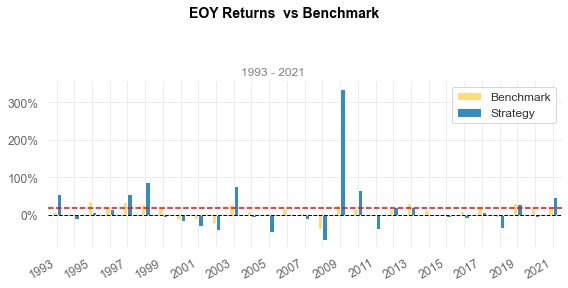

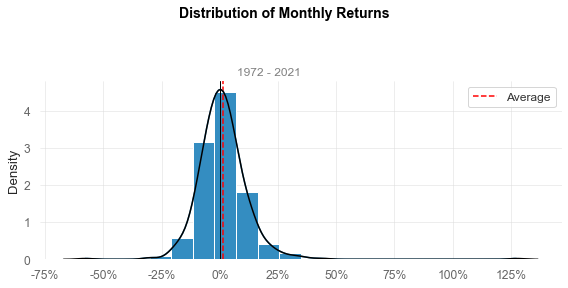

...

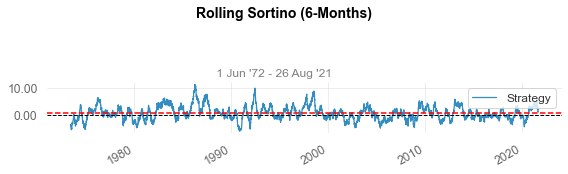

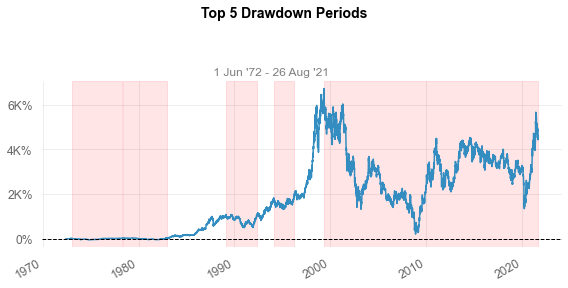

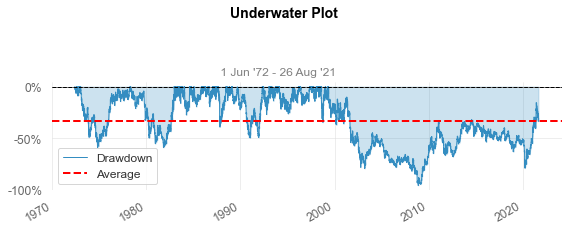

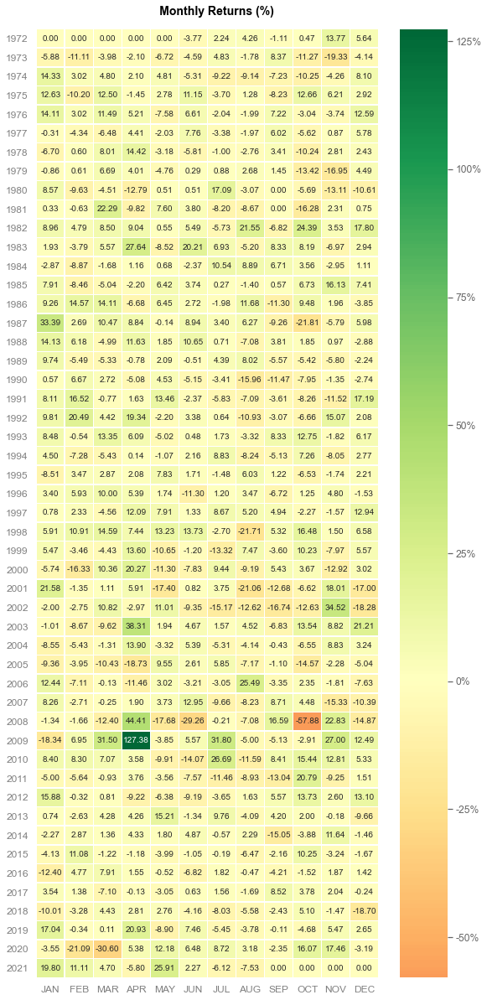

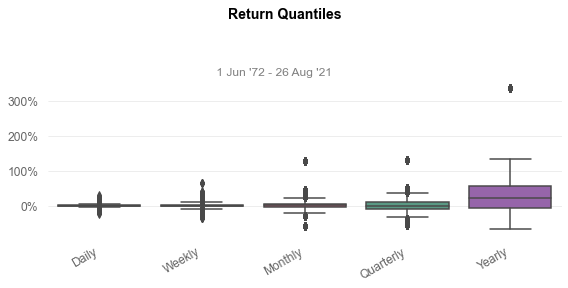

In [17]:
# Generate plots/ Using SPY (S&P500) as benchmark 

qs.extend_pandas()

F = qs.utils.download_returns('F')

qs.reports.full(F, "SPY")

## GDX - VanEck Gold Miners ETF

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               2006-05-22  2006-05-22
End Period                 2021-08-26  2021-08-26
Risk-Free Rate             0.0%        0.0%
Time in Market             100.0%      100.0%

Cumulative Return          -7.03%      376.01%
CAGR%                      -0.48%      10.76%

Sharpe                     0.2         0.61
Sortino                    0.29        0.86
Sortino/√2                 0.21        0.61

Max Drawdown               -80.57%     -55.19%
Longest DD Days            3639        1772
Volatility (ann.)          42.5%       20.02%
R^2                        0.07        0.07
Calmar                     -0.01       0.19
Skew                       0.23        -0.07
Kurtosis                   7.37        15.63

Expected Daily %           -0.0%       0.04%
Expected Monthly %         -0.04%      0.85%
Expected Yearly %          -0.45%      10.24%
Kelly Criterion            -4.

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2011-09-09,2016-01-19,2021-08-26,3639,-80.567923,-79.280830
2,2008-03-17,2008-10-27,2010-09-22,919,-70.985460,-65.615030
3,2006-09-06,2006-10-03,2007-02-26,173,-20.522591,-19.691237
4,2007-07-20,2007-08-16,2007-09-18,60,-19.958221,-18.264090
5,2011-04-11,2011-06-16,2011-09-02,144,-19.030497,-18.295541


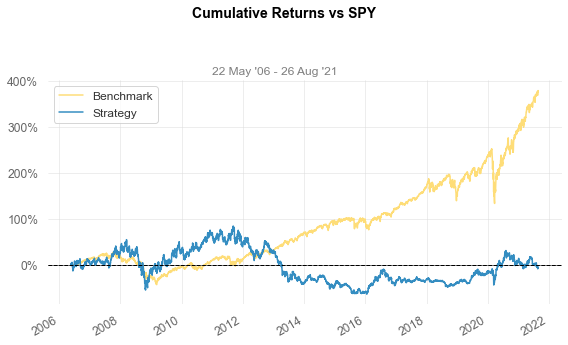

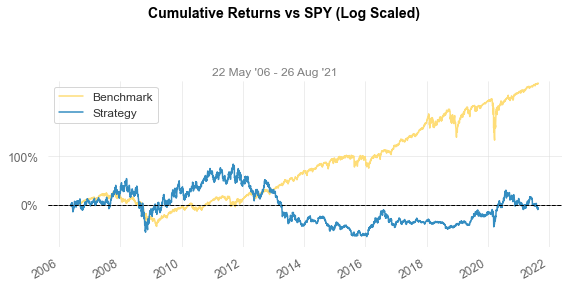

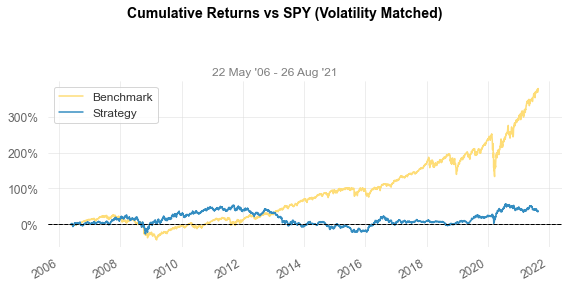

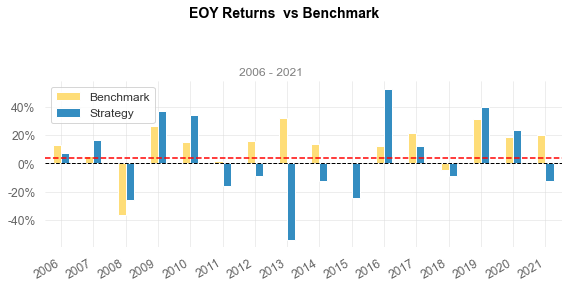

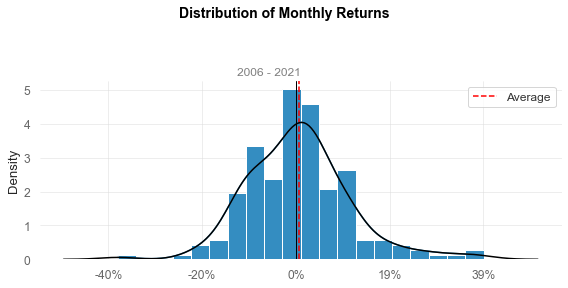

...

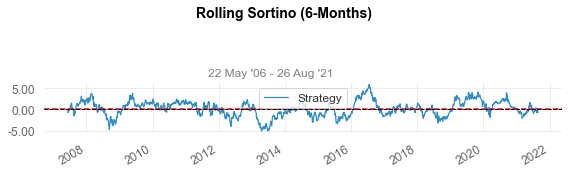

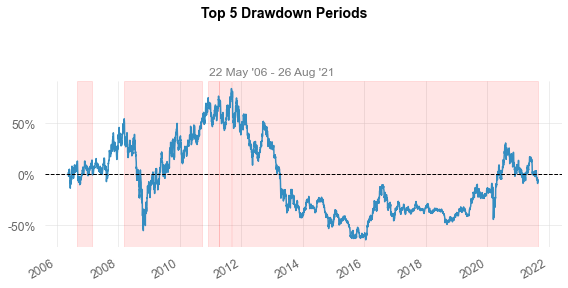

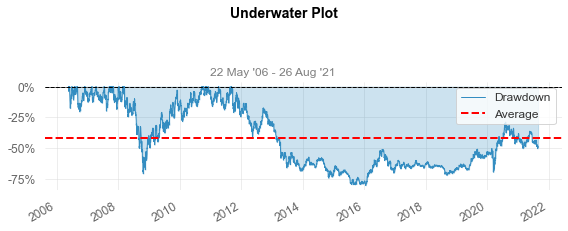

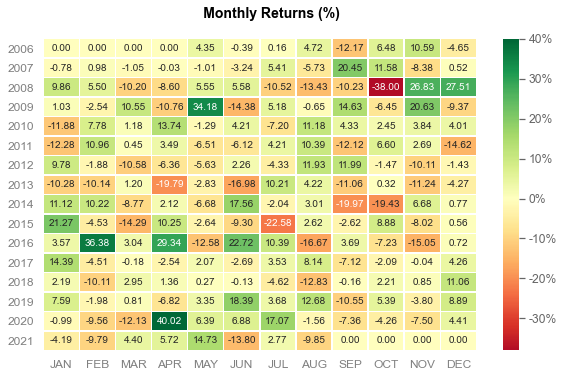

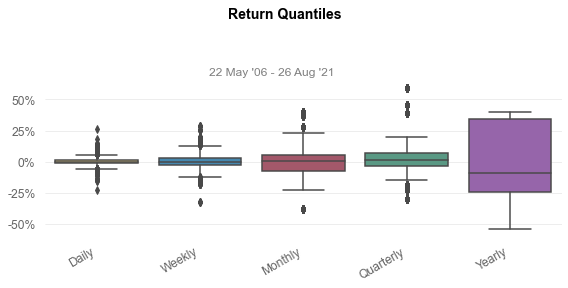

In [18]:
qs.extend_pandas()

GDX = qs.utils.download_returns('GDX')

qs.reports.full(GDX, "SPY")

## USO - United States Oil ETF

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               2006-04-10  2006-04-10
End Period                 2021-08-26  2021-08-26
Risk-Free Rate             0.0%        0.0%
Time in Market             100.0%      100.0%

Cumulative Return          -91.27%     367.04%
CAGR%                      -14.66%     10.53%

Sharpe                     -0.24       0.6
Sortino                    -0.32       0.85
Sortino/√2                 -0.23       0.6

Max Drawdown               -98.19%     -55.19%
Longest DD Days            4790        1772
Volatility (ann.)          37.17%      19.97%
R^2                        0.16        0.16
Calmar                     -0.15       0.19
Skew                       -0.67       -0.07
Kurtosis                   11.17       15.69

Expected Daily %           -0.06%      0.04%
Expected Monthly %         -1.31%      0.84%
Expected Yearly %          -14.14%     10.11%
Kelly Criterion            -7.23

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2008-07-15,2020-04-28,2021-08-26,4790,-98.186925,-97.187819
2,2006-07-14,2007-01-18,2007-10-31,474,-40.982936,-39.467577
3,2008-01-03,2008-02-06,2008-02-19,47,-12.042825,-11.431122
4,2007-11-21,2007-12-05,2008-01-02,42,-11.184373,-10.318071
5,2006-04-24,2006-06-13,2006-07-13,80,-10.479326,-10.328247


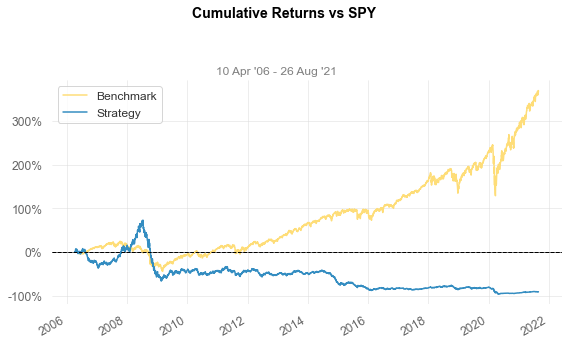

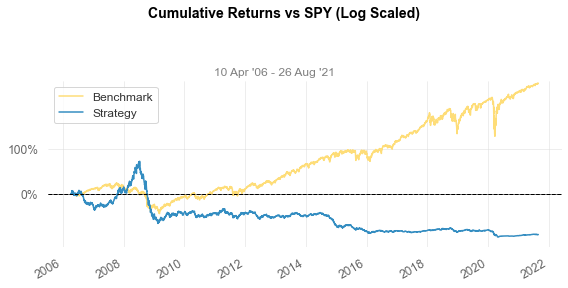

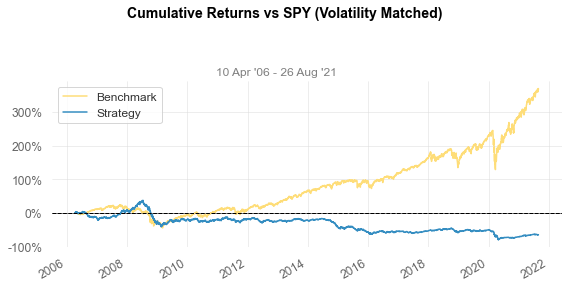

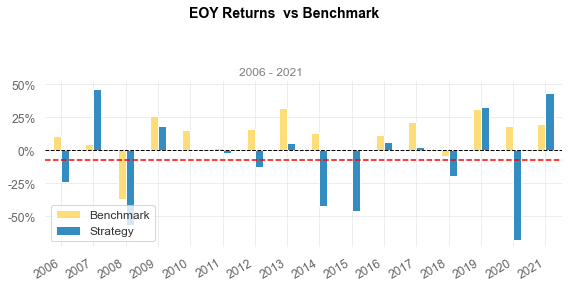

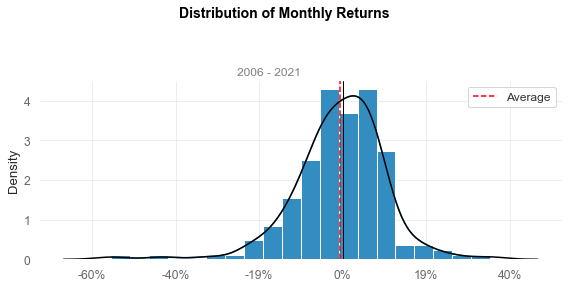

...

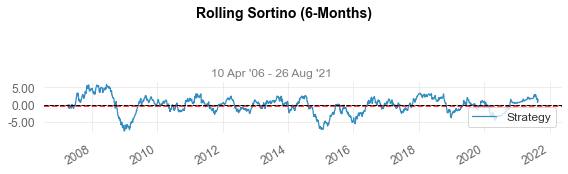

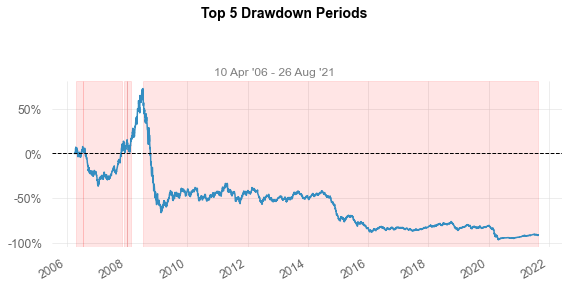

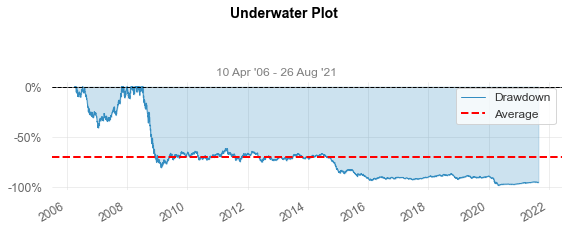

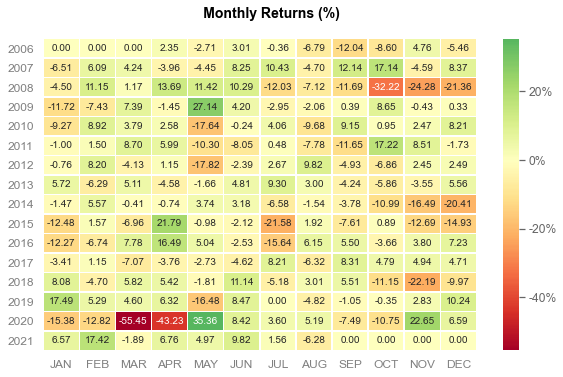

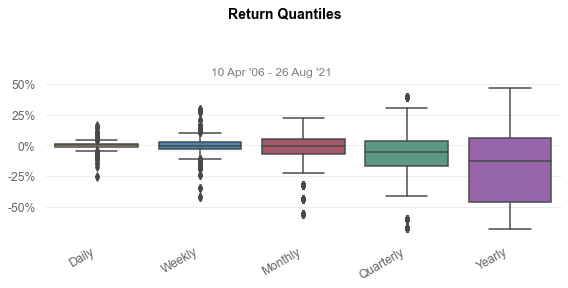

In [19]:
qs.extend_pandas()

USO = qs.utils.download_returns('USO')

qs.reports.full(USO, "SPY")